<a href="https://colab.research.google.com/github/MattJCR/scrapy_faces/blob/master/scrapy_faces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Creación del proyecto
Se crea un proyecto de scrapy para obtener las fotos ded un blog de modelos de fotografia con el objetivo de hacer reconocimiento facial.

* Se instala Scrapy:

In [ ]:
# instalación de Scrapy
!pip install Scrapy

* Se crea el proyecto project_faces:

In [2]:
# creación del proyecto
!scrapy startproject project_faces scrapy

New Scrapy project 'project_faces', using template directory '/usr/local/lib/python3.8/dist-packages/scrapy/templates/project', created in:
    /content/scrapy

You can start your first spider with:
    cd scrapy
    scrapy genspider example example.com


* Se crea el spider FindFaces que se encargará de obtener las fotografias de la pagina https://www.larajade.com/ de las cuales aplicaremos el reconocimiento facial:

In [3]:
# creación del spider
!cd scrapy/project_faces && scrapy genspider FindFaces https://www.larajade.com/

Created spider 'FindFaces' using template 'basic' in module:
  project_faces.spiders.FindFaces


## Edición de path/to/settings.py
* Se aplica la configuracion del spider:



In [4]:
%%writefile scrapy/project_faces/settings.py

BOT_NAME = 'project_faces'

SPIDER_MODULES = ['project_faces.spiders']
NEWSPIDER_MODULE = 'project_faces.spiders'

USER_AGENT = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/107.0.0.0 Safari/537.36'

ROBOTSTXT_OBEY = False

DEFAULT_REQUEST_HEADERS = {
   'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8',
   'Accept-Language': 'es',
}

REQUEST_FINGERPRINTER_IMPLEMENTATION = '2.7'
TWISTED_REACTOR = 'twisted.internet.asyncioreactor.AsyncioSelectorReactor'

Overwriting scrapy/project_faces/settings.py


# Implementación del spider
* Se aplica el codigo al spider para obtener los enlaces de las fotografías:

In [5]:
%%writefile scrapy/project_faces/spiders/FindFaces.py
import scrapy

class FindfacesSpider(scrapy.Spider):
    name = 'FindFaces'
    allowed_domains = ['https://www.larajade.com/']
    start_urls = ['https://www.larajade.com/']
    pages = 1
    def parse(self, response):
      images = response.xpath('//body/div/div[id("site")]/div[id("content")]/main/div[contains(@class, "main-content")]/div/div/div/div/div')
      print('numero de entradas:', len(images))
      for img in images:
        img = img.xpath('img/@data-src').get()
        yield {
          'img': img
        }

Overwriting scrapy/project_faces/spiders/FindFaces.py


## Ejecución del spider
* Se ejecuta el spider y se guardan los enlaces extraidos de la web en faces.json:

In [ ]:
!cd scrapy/project_faces && scrapy crawl FindFaces -O faces.json

## Procesando las caras de las imágenes
* Importamos las librerias necesarias:

In [7]:
from io import BytesIO
import cv2
from PIL import Image
import json
import numpy as np
import requests
from statistics import mean
import math
import random

* Obtenemos un array de imagenes de los enlaces guardados en el json generado por scrapy:

In [8]:
json_file = 'scrapy/project_faces/faces.json'
with open(json_file, 'r') as f:
  data = json.load(f)

images = []
for item in data:
  url = item['img']
  img = Image.open(BytesIO(requests.get(url).content))
  # img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
  images.append(img)

* Definimos un metodo para crear un collage de un conjunto de imagenes:

In [9]:
def create_collage(faces_list,size=(200, 200)):
  faces_per_row = math.ceil(math.sqrt(len(faces_list)))
  while len(faces_list)%faces_per_row != 0:
    faces_list.append(random.choice(faces_list))
  counter = 1
  matrix = None
  nueva_fila = True
  for img in faces_list:
    img = np.asarray(Image.fromarray(img).resize(size))
    if nueva_fila:
      fila = img
      nueva_fila = False
    else:
      fila = np.hstack([fila, img])
    if counter == faces_per_row:
          matrix = fila
          nueva_fila = True
    elif counter % faces_per_row == 0:
        matrix = np.vstack([matrix, fila])
        nueva_fila = True
    counter += 1
  return Image.fromarray(matrix)

* Hacemos un collage de todas las imagenes extraidas:

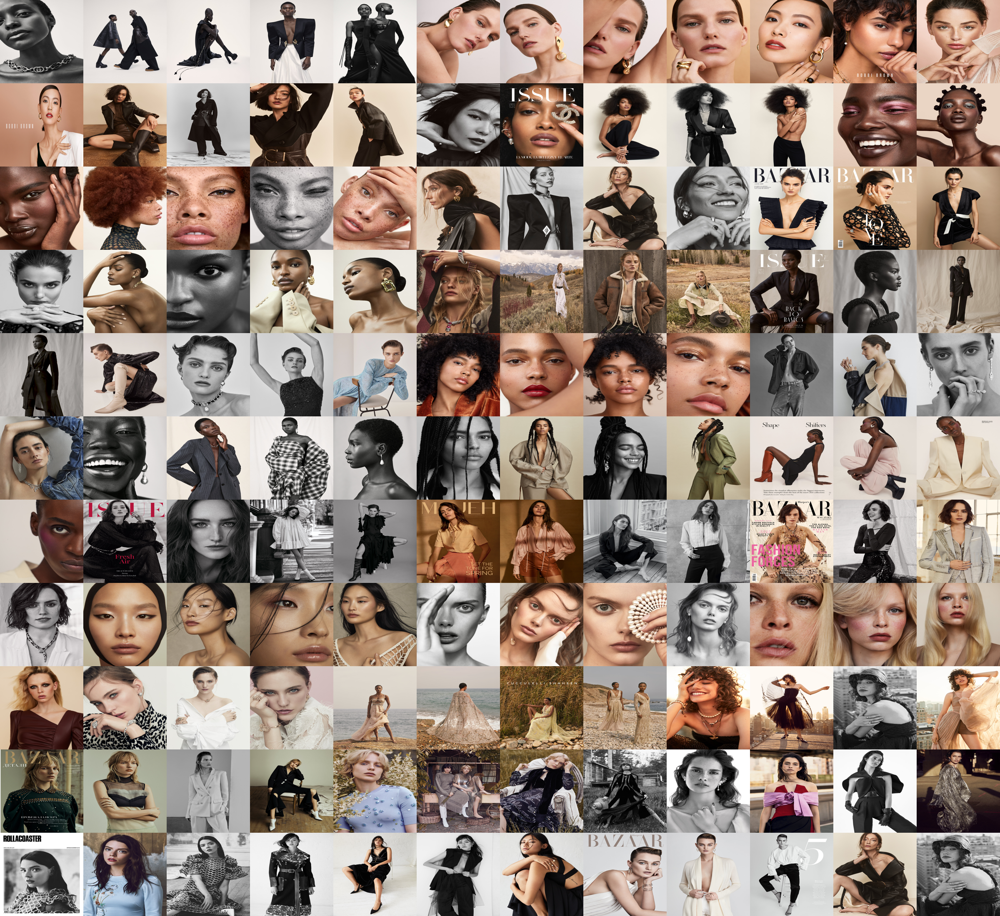

In [10]:
images_np = []
for img in images: images_np.append(np.asarray(img))
create_collage(images_np)

* Calculamos el minSize que vamos a utilizar para el reconocimiento de caras:

In [11]:
height = []
width = []
# Calculamos el minimo del tamaño que debe de tener una cara
for img in images:
  width.append(img.width)
  height.append(img.height)
height = math.ceil(math.sqrt(mean(height)))*2
width = math.ceil(math.sqrt(mean(width)))*2
minSize = (width,height)
print('minSize:',minSize)

minSize: (68, 78)


* Definimos un metodo para detectar o obtener las caras de nuestra lista de fotografias:

In [12]:
def find_faces(images,minSize=(30,30)):
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")
  faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_alt.xml")
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_alt2.xml")
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_alt_tree.xml")
  #faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_upperbody.xml")
  face_count = 0
  faces_list = []
  for img in images:
    img_np = np.array(img)
    color = cv2.cvtColor(img_np, cv2.COLOR_BGR2GRAY)
    #color = cv2.cvtColor(img_np, cv2.COLOR_BGR2HSV)
    #color = cv2.cvtColor(img_np, cv2.COLOR_BGR2Luv)
    # Estas propiedades estan optimizada para el conjunto de fotografias obtenido por scrapy
    faces = faceCascade.detectMultiScale(
          color,
          scaleFactor = 1.0625,
          minNeighbors = 8,
          minSize = minSize,
          maxSize = (img.width,img.height)
    )
    for face in faces:
      x = face[1]
      y = face[0]
      w = face[3]
      h = face[2]
      faces_list.append(img_np[x:x+w,y:y+h])
    face_count += len(faces)
  print(face_count)
  return faces_list

* Ejecutamos la busqueda de caras y creamos un collage con el resultado:

76


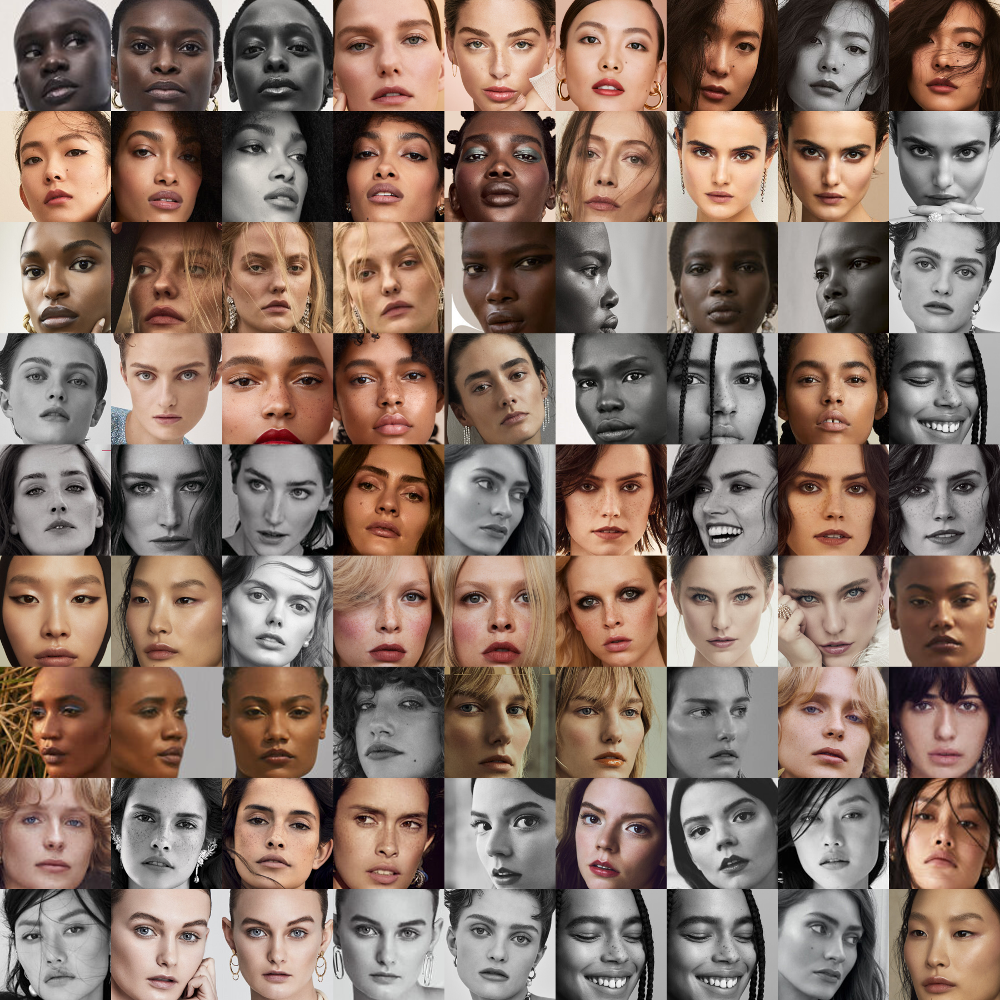

In [13]:
faces_list = find_faces(images,minSize)
create_collage(faces_list)